In [168]:
import time
import os
import sys

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('seaborn-whitegrid')
from tqdm import tqdm, tqdm_notebook

## Read NYC Green Taxi Data

Read by chunks. Preprocess and clean data.

In [169]:
nyc_taxi_trip_data_path = os.path.join('NYC-Taxi-Data', '2015_Green_Taxi_Trip_Data.csv')
reader = pd.read_csv(nyc_taxi_trip_data_path, error_bad_lines=False, chunksize=4)
nyc_taxi_trip_df = reader.get_chunk(100000)

b'Skipping line 97579: expected 21 fields, saw 22\n'


In [170]:
nyc_taxi_trip_df.head()

,vendorid,pickup_datetime,dropoff_datetime,Store_and_fwd_flag,rate_code,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,...,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,Improvement_surcharge,Total_amount,Payment_type,Trip_type
0,2,02/10/2015 08:46:15 AM,02/10/2015 08:59:50 AM,N,1,-73.828262,40.693958,-73.776329,40.645348,1,...,19.0,0.0,0.5,4.75,0.0,NaN,0.3,24.55,1,1
1,2,01/09/2015 03:45:22 PM,01/09/2015 03:54:32 PM,N,1,-73.985672,40.669933,-73.998367,40.679829,3,...,7.5,0.0,0.5,1.50,0.0,NaN,0.3,9.80,1,1
2,2,01/16/2015 10:07:38 PM,01/16/2015 10:14:25 PM,N,1,-73.892570,40.746658,-73.909294,40.736202,1,...,7.5,0.5,0.5,0.00,0.0,NaN,0.3,8.80,2,1
3,2,02/11/2015 08:12:29 PM,02/11/2015 08:16:39 PM,N,1,-73.952034,40.714123,-73.957848,40.710945,1,...,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1
4,2,02/26/2015 10:42:27 AM,02/26/2015 10:57:30 AM,N,1,-73.894104,40.750774,-73.912811,40.755722,2,...,11.0,0.0,0.5,0.00,0.0,NaN,0.3,11.80,2,1


In [171]:
nyc_taxi_trip_df.describe()

,vendorid,rate_code,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,Trip_distance,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,Improvement_surcharge,Total_amount,Payment_type,Trip_type
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,0.0,100000.000000,100000.000000,100000.000000,100000.000000
mean,1.782090,1.099680,-73.852617,40.706513,-73.823705,40.689220,1.375870,2.785728,12.125808,0.352317,0.486365,1.182621,0.105045,NaN,0.288336,14.539896,1.559820,1.023450
std,0.412828,0.614156,2.462257,1.358216,2.852205,1.572907,1.057394,3.014565,13.436424,0.369867,0.085420,6.857903,0.900250,NaN,0.058008,17.733677,0.522173,0.151329
min,1.000000,1.000000,-74.200844,0.000000,-74.257263,0.000000,0.000000,0.000000,-116.000000,-1.000000,-0.500000,-1.060000,-9.750000,NaN,-0.300000,-116.000000,1.000000,1.000000
25%,2.000000,1.000000,-73.958712,40.700493,-73.966331,40.702884,1.000000,1.010000,6.000000,0.000000,0.500000,0.000000,0.000000,NaN,0.300000,7.800000,1.000000,1.000000
50%,2.000000,1.000000,-73.944626,40.747286,-73.943989,40.749590,1.000000,1.830000,9.000000,0.500000,0.500000,0.000000,0.000000,NaN,0.300000,11.160000,2.000000,1.000000
75%,2.000000,1.000000,-73.916496,40.804638,-73.909737,40.796853,1.000000,3.550000,15.000000,0.500000,0.500000,1.880000,0.000000,NaN,0.300000,17.750000,2.000000,1.000000
max,2.000000,6.000000,0.000000,42.632847,0.000000,42.616947,8.000000,326.200000,2084.000000,1.000000,0.500000,1766.050000,105.990000,NaN,0.300000,3532.100000,5.000000,2.000000


In [172]:
# nyc_taxi_trip_df[nyc_taxi_trip_df['pickup_datetime'] == pickupdropoff_time[0]].iloc[0, :]

### Filter column values
#### fare_amount 
```fare_amount``` shoud be > 0 and small than 0.99 quantile value.

In [173]:
def print_quantile_values(series, quantile=[0.1, 0.5, 0.9, 0.95, 0.99]):
    print('Quantile of {}: '.format(series.name), end='')
    for q in [0.1, 0.5, 0.9, 0.95, 0.99]:
        print('{:.0%} {}'.format(q, series.quantile([0.99]).iloc[0]), end=', ')
    print()

def filter_df_column_values(df, column, min_value, max_value, including_minmax=True):
    assert column in df.columns, 'Column not found in given datafram !'
    if including_minmax:
        return df[(df[column] >= min_value) &
                  (df[column] <= max_value)]
    else:
        return df[(df[column] > min_value) &
                  (df[column] < max_value)]
    
print_quantile_values(nyc_taxi_trip_df['Fare_amount'])

print('Old size before filter: {}'.format(len(nyc_taxi_trip_df)))
nyc_taxi_trip_df = filter_df_column_values(nyc_taxi_trip_df, 'Fare_amount', 
                                           0, nyc_taxi_trip_df['Fare_amount'].quantile([0.99]).iloc[0])
nyc_taxi_trip_df = filter_df_column_values(nyc_taxi_trip_df, 'Fare_amount', 
                                           0, nyc_taxi_trip_df['Fare_amount'].max()+1, including_minmax=False)
print('New size after filter: {}'.format(len(nyc_taxi_trip_df)))

Quantile of Fare_amount: 10% 47.0, 50% 47.0, 90% 47.0, 95% 47.0, 99% 47.0, 
Old size before filter: 100000
New size after filter: 98534


In [174]:
nyc_taxi_trip_df['Fare_amount'].describe()

count    98534.000000
mean        11.626792
std          7.544288
min          0.010000
25%          6.000000
50%          9.000000
75%         15.000000
max         47.000000
Name: Fare_amount, dtype: float64

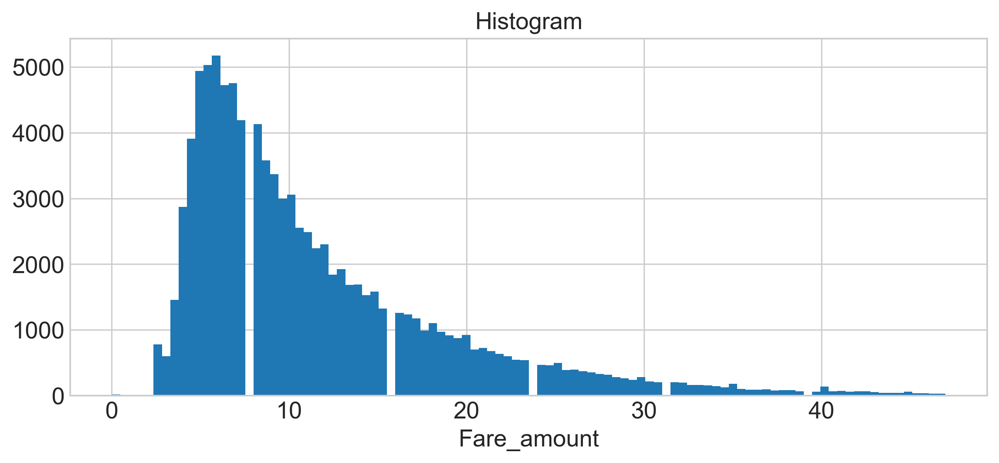

In [175]:
def histogram_series(series, bins=100):
    fig = plt.figure(figsize=[10, 4], dpi=300)
    ax = fig.subplots(1, 1)
    ax.hist(series, bins=bins)
    ax.set_xlabel(series.name, fontsize='x-large')
    ax.set_title('Histogram', fontsize='x-large')
    ax.tick_params(labelsize='x-large')
    plt.savefig('imgs/{}-hist.png'.format(series.name), dpi=300)
    plt.show()
histogram_series(nyc_taxi_trip_df['Fare_amount'])

#### NaN data

Sum of NaNs showed all ok. The ```Ehail_fee``` is not considered.

In [176]:
nyc_taxi_trip_df.isnull().sum()

vendorid                     0
pickup_datetime              0
dropoff_datetime             0
Store_and_fwd_flag           0
rate_code                    0
Pickup_longitude             0
Pickup_latitude              0
Dropoff_longitude            0
Dropoff_latitude             0
Passenger_count              0
Trip_distance                0
Fare_amount                  0
Extra                        0
MTA_tax                      0
Tip_amount                   0
Tolls_amount                 0
Ehail_fee                98534
Improvement_surcharge        0
Total_amount                 0
Payment_type                 0
Trip_type                    0
dtype: int64

#### Passenger count

In [177]:
print_quantile_values(nyc_taxi_trip_df['Passenger_count'])

Quantile of Passenger_count: 10% 6.0, 50% 6.0, 90% 6.0, 95% 6.0, 99% 6.0, 


In [178]:
print('Old size before filter: {}'.format(len(nyc_taxi_trip_df)))
nyc_taxi_trip_df = filter_df_column_values(nyc_taxi_trip_df, 'Passenger_count', 1, 6)
print('New size after filter: {}'.format(len(nyc_taxi_trip_df)))

Old size before filter: 98534
New size after filter: 98508


In [179]:
print_quantile_values(nyc_taxi_trip_df['Passenger_count'])
nyc_taxi_trip_df['Passenger_count'].describe()

Quantile of Passenger_count: 10% 6.0, 50% 6.0, 90% 6.0, 95% 6.0, 99% 6.0, 


count    98508.000000
mean         1.376061
std          1.057312
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          6.000000
Name: Passenger_count, dtype: float64

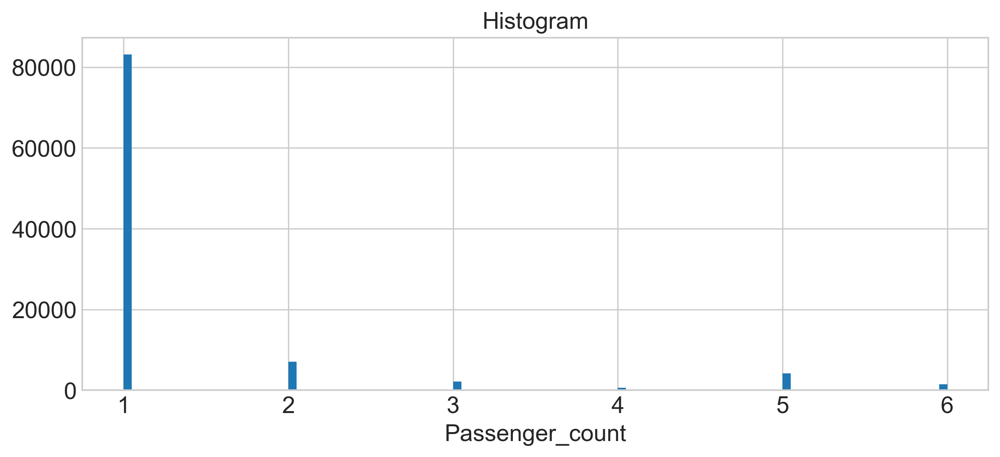

In [180]:
histogram_series(nyc_taxi_trip_df['Passenger_count'])

#### Trip distance

In [181]:
print_quantile_values(nyc_taxi_trip_df['Trip_distance'])

Quantile of Trip_distance: 10% 11.87, 50% 11.87, 90% 11.87, 95% 11.87, 99% 11.87, 


In [182]:
nyc_taxi_trip_df['Trip_distance'].describe()

count    98508.000000
mean         2.681989
std          2.464046
min          0.000000
25%          1.010000
50%          1.820000
75%          3.500000
max         31.260000
Name: Trip_distance, dtype: float64

In [183]:
print('Old size before filter: {}'.format(len(nyc_taxi_trip_df)))
nyc_taxi_trip_df = filter_df_column_values(nyc_taxi_trip_df, 'Trip_distance', 
                                           0, nyc_taxi_trip_df['Trip_distance'].max()+1, including_minmax=False)
print('New size after filter: {}'.format(len(nyc_taxi_trip_df)))

Old size before filter: 98508
New size after filter: 97331


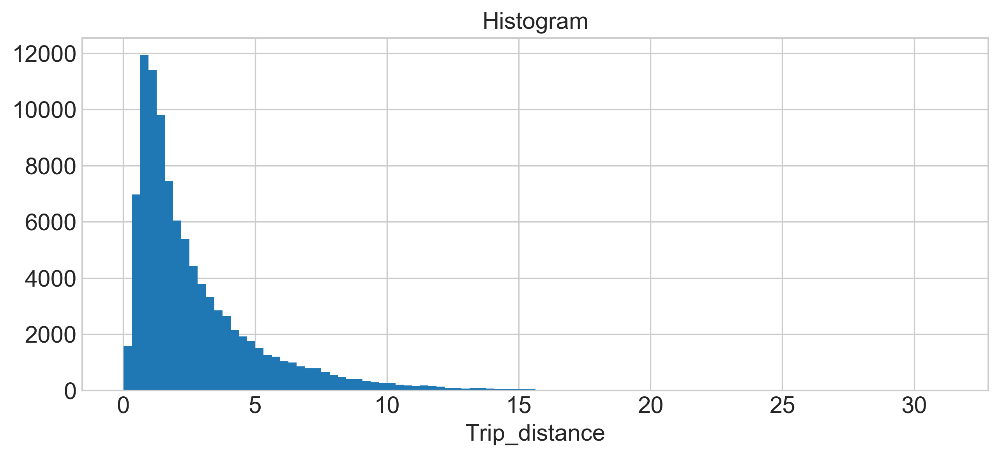

In [184]:
histogram_series(nyc_taxi_trip_df['Trip_distance'])

### Select interested columns

In [185]:
nyc_taxi_trip_df.columns

Index(['vendorid', 'pickup_datetime', 'dropoff_datetime', 'Store_and_fwd_flag',
       'rate_code', 'Pickup_longitude', 'Pickup_latitude', 'Dropoff_longitude',
       'Dropoff_latitude', 'Passenger_count', 'Trip_distance', 'Fare_amount',
       'Extra', 'MTA_tax', 'Tip_amount', 'Tolls_amount', 'Ehail_fee',
       'Improvement_surcharge', 'Total_amount', 'Payment_type', 'Trip_type'],
      dtype='object')

In [186]:
def print_mem_usage(df):
    print('Mem usage: {:.4f} MB'.format(df.memory_usage(deep=True).sum() / (1024**2)))

In [187]:
print_mem_usage(nyc_taxi_trip_df)
nyc_taxi_trip_df = nyc_taxi_trip_df[['pickup_datetime', 'dropoff_datetime',
                                     'Pickup_longitude', 'Pickup_latitude',
                                     'Dropoff_longitude', 'Dropoff_latitude']]
print_mem_usage(nyc_taxi_trip_df)

Mem usage: 34.5298 MB
Mem usage: 18.3788 MB


### Coordinate filter

1. Some longitudes and latitudes are 0. Filter them out.
2. Calculate the bounding box of NYC Green Taxi trip data, denoted as ```data_bbox```.
3. Select trip data within manually chosed city bbox.

NYC Coordinate (-74.0063889, 40.7141667)

In [188]:
nyc_taxi_trip_df.describe()

,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude
count,97331.000000,97331.000000,97331.000000,97331.000000
mean,-73.890196,40.726858,-73.867775,40.713255
std,1.820257,1.004706,2.222652,1.226144
min,-74.177223,0.000000,-74.177223,0.000000
25%,-73.958851,40.700554,-73.966728,40.703808
50%,-73.944885,40.747196,-73.944435,40.749683
75%,-73.917015,40.804539,-73.910797,40.796474
max,0.000000,42.632847,0.000000,42.616947


In [189]:
nyc_taxi_trip_df = \
    nyc_taxi_trip_df[
        (nyc_taxi_trip_df['Pickup_longitude']<0) & (nyc_taxi_trip_df['Dropoff_longitude']<0) \
         & (nyc_taxi_trip_df['Pickup_latitude']>0) & (nyc_taxi_trip_df['Dropoff_latitude']>0)]
nyc_taxi_trip_df.describe()

,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude
count,97201.000000,97201.000000,97201.000000,97201.000000
mean,-73.935010,40.751565,-73.934620,40.750103
std,0.041289,0.057966,0.048183,0.058318
min,-74.177223,40.572853,-74.177223,40.549423
25%,-73.958855,40.700596,-73.966759,40.703991
50%,-73.944901,40.747211,-73.944466,40.749737
75%,-73.917076,40.804546,-73.910919,40.796562
max,-73.623024,42.632847,-73.612122,42.616947


In [190]:
data_bbox = [None, None, None, None]
agg_df = nyc_taxi_trip_df.agg(['min', 'max'])
data_bbox[0] = min(agg_df.loc['min', 'Pickup_longitude'], agg_df.loc['min', 'Dropoff_longitude'])
data_bbox[1] = min(agg_df.loc['min', 'Pickup_latitude'], agg_df.loc['min', 'Dropoff_latitude'])
data_bbox[2] = max(agg_df.loc['max', 'Pickup_longitude'], agg_df.loc['max', 'Dropoff_longitude'])
data_bbox[3] = max(agg_df.loc['max', 'Pickup_latitude'], agg_df.loc['max', 'Dropoff_latitude'])
data_bbox

[-74.1772232055664, 40.54942321777344, -73.61212158203125, 42.63284683227539]

In [191]:
city_bbox = [-74.0, 40.75, -73.8, 40.90]
# Distance of four edges of the bounding box. Unit is meters.
city_bbox_edge_length = {'bottom': 16850, 'top': 16810, 'left': 16680, 'right': 16680}
# length of longitude and latitude spans (meters)
city_bbox_size = [(city_bbox_edge_length['bottom']+city_bbox_edge_length['top'])/2, city_bbox_edge_length['left']]

In [192]:
def select_within_boundingbox(df, BB):
    return (df.Pickup_longitude >= BB[0]) & (df.Pickup_longitude <= BB[2]) & \
           (df.Pickup_latitude >= BB[1]) & (df.Pickup_latitude <= BB[3]) & \
           (df.Dropoff_longitude >= BB[0]) & (df.Dropoff_longitude <= BB[2]) & \
           (df.Dropoff_latitude >= BB[1]) & (df.Dropoff_latitude <= BB[3])

In [193]:
print('Old size: {}'.format(len(nyc_taxi_trip_df)))
nyc_taxi_trip_df = nyc_taxi_trip_df[select_within_boundingbox(nyc_taxi_trip_df, city_bbox)]
nyc_taxi_trip_df = nyc_taxi_trip_df.reset_index(drop=True)
print('New size: {}'.format(len(nyc_taxi_trip_df)))

Old size: 97201
New size: 40819


### Datetime filter

In [194]:
# Convert datetime columns to pandas datatime type
for column in ['pickup_datetime', 'dropoff_datetime']:
    nyc_taxi_trip_df[column] = pd.to_datetime(nyc_taxi_trip_df[column])

In [206]:
series = (nyc_taxi_trip_df['dropoff_datetime'] - nyc_taxi_trip_df['pickup_datetime'])
a = []
for row in series:
    a.append(row.total_seconds())

(array([4.0769e+04, 3.0000e+00, 5.0000e+00, 4.0000e+00, 2.0000e+00,
        0.0000e+00, 2.0000e+00, 1.0000e+00, 1.0000e+00, 3.2000e+01]),
 array([    0. ,  8633.5, 17267. , 25900.5, 34534. , 43167.5, 51801. ,
        60434.5, 69068. , 77701.5, 86335. ]),
 <a list of 10 Patch objects>)

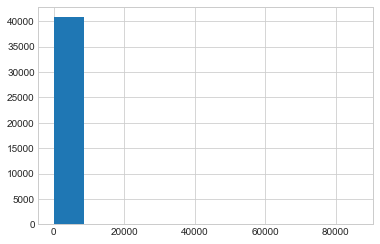

In [208]:
plt.hist(a)

#### Monthly seperate trip data

In [17]:
def get_df_by_month(month, df, datetime_column, year=2015):
    start_datetime = pd.to_datetime('{:4d}-{:02d}-01 0:0:0'.format(year, month))
    end_datetime = start_datetime + pd.offsets.MonthEnd()+pd.offsets.Day()
    return df[(df[datetime_column] >= start_datetime) &
              (df[datetime_column] < end_datetime)].reset_index(drop=True)

monthly_trip_df_list = []
for month in range(1, 13, 1):
    monthly_trip_df_list.append(
        get_df_by_month(month, nyc_taxi_trip_df, 'pickup_datetime')
    )
    print('Month {:02d}: size: {}'.format(month, len(monthly_trip_df_list[-1])))
print('Summed count of monthly trip df: {}'.format(sum([len(df) for df in monthly_trip_df_list])))

Month 01: size: 5179
Month 02: size: 35546
Month 03: size: 14
Month 04: size: 16
Month 05: size: 13
Month 06: size: 3
Month 07: size: 9
Month 08: size: 12
Month 09: size: 8
Month 10: size: 9
Month 11: size: 6
Month 12: size: 4
Summed count of monthly trip df: 40819


#### Dayly seperate trip data

In [64]:
def get_df_by_weekday(weekday, df, datetime_column):
    return df[df[datetime_column].dt.dayofweek == weekday].reset_index(drop=True)

weekday_df_list = []
for weekday in range(7):
    weekday_df_list.append(
        get_df_by_weekday(weekday, nyc_taxi_trip_df, 'pickup_datetime')
    )
    print('Weekday {:02d}: size: {}'.format(weekday, len(weekday_df_list[-1])))
print('Summed count of weekday trip df: {}'.format(sum([len(df) for df in weekday_df_list])))
print('Average trip count per day: {}'.format(
    np.mean([len(df) for df in weekday_df_list])))

Weekday 00: size: 2021
Weekday 01: size: 2140
Weekday 02: size: 2330
Weekday 03: size: 2612
Weekday 04: size: 2902
Weekday 05: size: 2439
Weekday 06: size: 1882
Summed count of weekday trip df: 16326
Average trip count per day: 2332.285714285714


#### Hourly seperate trip data

In [ ]:
def get_df_by_hour(start_hour, df, datetime_column):
    datetime_indexed_df = df.set_index(datetime_column, drop=False)
    return datetime_indexed_df.between_time('{}:0:0'.format(hour), '{}:59:59'.format(hour)).reset_index(drop=True)

hourly_trip_df_list = []
pickup_index_df = nyc_taxi_trip_df.set_index('pickup_datetime', drop=False)
for hour in range(24):
    hourly_trip_df_list.append(
        get_df_by_hour(hour, nyc_taxi_trip_df, 'pickup_datetime'))
    print('Hour [{:02d} to {:02d}]: size: {}'.format(hour, hour+1, len(hourly_trip_df_list[-1])))
print('Summed count of hourly trip df: {}'.format(sum([len(df) for df in hourly_trip_df_list])))

In [ ]:
hourly_trip_df_sizes =  [len(df) for df in hourly_trip_df_list]
fig = plt.figure(figsize=[10, 4], dpi=300)
ax = fig.subplots(1, 1)
ax.plot(hourly_trip_df_sizes)
ax.set_xticks(range(24))
xticklabels = []
for hour in range(24):
    if hour%2==0:
        xticklabels.append('{}:00-{}:00'.format(hour, hour+1))
    else:
        xticklabels.append('')
ax.set_xticklabels(xticklabels, rotation=45)
ax.set_ylabel('Trip counts')
ax.tick_params(labelsize='large')
plt.savefig('imgs/hourly-trip-count.png', dpi=300, tight_layout=True, bbox_inches='tight')
plt.show()

## Point plot on map

In [100]:
# this function will be used more often to plot data on the NYC map
def plot_location_points(df, BB, nyc_map=None, s=10, alpha=0.2, ax=None, savefig_name=None, color_origin='r', color_destiny='r'):
    hw_ratio = (BB[3]-BB[1]) / (BB[2]-BB[0])
#     hw_ratio = 1.0
    if ax is None:
        fig_width = 20
        fig, ax = plt.subplots(1, 1, figsize=(fig_width, fig_width*hw_ratio), dpi=300)
        fig.tight_layout()
    ax.scatter(df.Pickup_longitude, df.Pickup_latitude, zorder=1, alpha=alpha, c=color_origin, s=s)
    ax.scatter(df.Dropoff_longitude, df.Dropoff_latitude, zorder=1, alpha=alpha, c=color_destiny, s=s)
    ax.set_xlim((BB[0], BB[2]))
    ax.set_xticks(np.linspace(BB[0], BB[2], num=10, endpoint=True))
    ax.set_ylim((BB[1], BB[3]))
    ax.set_yticks(np.linspace(BB[3], BB[1], num=10, endpoint=True))
    ax.set_title('Pickup & Dropoff locations', fontsize='x-large')
    if nyc_map is not None:
        ax.imshow(nyc_map, zorder=0, extent=(BB[0], BB[2], BB[1], BB[3]))
    if savefig_name is not None:
        plt.savefig('imgs/{}.jpg'.format(savefig_name), dpi=300, tight_layout=True, bbox_inches='tight')

### City range

In [ ]:
plot_location_points(nyc_taxi_trip_df, city_bbox, None, s=4, alpha=0.5, savefig_name='city-bbox-point-plot', 
                     color_origin='b', color_destiny='r')

### Manually select bounding box

In [97]:
7477/2

3738.5

In [19]:
# bbox_large = [-73.9778, 40.7833, -73.8889, 40.8500]
# edge_length_large = {'bottom': 7485, 'top': 7477,'left': 7417,'right': 7417}
# bbox_size_large = [(edge_length_large['bottom']+edge_length_large['top'])/2, edge_length_large['left']]
bbox_large = [-73.9778, 40.7833, -73.9333, 40.8500]
edge_length_large = {'bottom': 7485/2, 'top': 7477/2,'left': 7417,'right': 7417}
bbox_size_large = [(edge_length_large['bottom']+edge_length_large['top'])/2, edge_length_large['left']]

bbox_small = [-73.9556, 40.8000, -73.9333, 40.8167]
edge_length_small = {'bottom': 1877, 'top': 1877,'left': 1857,'right': 1857}
bbox_size_small = [(edge_length_small['bottom']+edge_length_small['top'])/2, edge_length_small['left']]


def get_figsize_for_bbox(bbox, figwidth=10):
    figheight = (bbox[3] - bbox[1])/(bbox[2] - bbox[0])*figwidth
    return figwidth, figheight


print('Large bbox (in city bbox) area ratio: {:.2%} data ratio: {:.2%}'
      .format(16/81, 
              len(nyc_taxi_trip_df[select_within_boundingbox(nyc_taxi_trip_df, bbox_large)])/len(nyc_taxi_trip_df)))
print('Small bbox (in large bbox) area ratio: {:.2%} data ratio: {:.2%}'
      .format(1/16, 
              len(nyc_taxi_trip_df[select_within_boundingbox(nyc_taxi_trip_df, bbox_small)])/
              len(nyc_taxi_trip_df[select_within_boundingbox(nyc_taxi_trip_df, bbox_large)])))

Large bbox (in city bbox) area ratio: 19.75% data ratio: 40.00%
Small bbox (in large bbox) area ratio: 6.25% data ratio: 14.77%


In [ ]:
map_small_bbox = plt.imread('Map-Data/map_small_bbox.jpeg')
plot_location_points(nyc_taxi_trip_df, bbox_small, map_small_bbox, s=2, alpha=0.3, savefig_name='small-bbox-point-plot',
                    color_origin='b', color_destiny='r')

### Weekday seperate range

In [ ]:
# for i in range(0, 7):
#     plot_location_points(weekday_df_list[i], bbox_large, None, s=3, alpha=0.5, savefig_name='weekday-{}'.format(i))
business_day_df = pd.concat([df for df in weekday_df_list[0:5]])
non_business_day_df = pd.concat([df for df in weekday_df_list[5:]])
plot_location_points(business_day_df.iloc[::5, :], bbox_large, None, s=3, alpha=0.5, savefig_name='businessday-point-plot',
                    color_origin='b', color_destiny='r')
plot_location_points(non_business_day_df.iloc[::2, :], bbox_large, None, s=3, alpha=0.5, savefig_name='nonbusinessday-point-plot',
                    color_origin='b', color_destiny='r')

### Read map pbf

In [ ]:
import pydriosm as dri
from matplotlib.lines import Line2D

In [ ]:
new_york_pbf = dri.read_osm_pbf('New York', data_dir='Map-Data/', 
                                       verbose=True)

In [ ]:
fig = plt.figure(figsize=[20, 20])
ax = plt.subplot(1, 1, 1)
for i in range(10000):
    linestring = new_york_pbf['lines'].loc[i, 'coordinates']
    xdata, ydata = tuple(zip(*[coord for coord in linestring.coords]))
#     print('Line length: ', len(xdata))
    ax.plot(list(xdata), list(ydata), linewidth=1, color='b')
# ax.add_line(Line2D([0, 1, 2], [0, 1, 2], linewidth=1, color='b'))
plt.show()

## Hot Grid Cells and City Partitions
Grids are squares that split the whole city. 

* We choose grid size as 10m.
* The grid index coordination origins from lower left of the city map.
* The x indices correspond to the longitude.
* The y indices correspond to the latitude.
* After splitting, filter out the trip data outside grid range.

In [20]:
def split2grids(bbox, bbox_size, grid_size):
    """bbox is the coordinates of two corners (left down, right up).
    
    bbox_size is the real size of bound box in earth by longitude and latitude axis (in meters).
    
    grid_size is the grid size to split the city into (unit meters).
    """
    grid_num_x = int(bbox_size[0] / grid_size)
    grid_num_y = int(bbox_size[1] / grid_size)
    longitude_step = (bbox[2] - bbox[0]) / grid_num_x
    latitude_step =  (bbox[3] - bbox[1]) / grid_num_y
    return grid_num_x, grid_num_y, longitude_step, latitude_step

# Split city to grids in 10 meters squares
grid_size = 10
grid_num_x, grid_num_y, longitude_step, latitude_step = split2grids(bbox_large, bbox_size_large, grid_size)
nyc_taxi_trip_df = nyc_taxi_trip_df[select_within_boundingbox(
    nyc_taxi_trip_df,
    [bbox_large[0], bbox_large[1], 
     bbox_large[0]+grid_num_x*longitude_step, bbox_large[1]+grid_num_y*latitude_step])]
print('Large bounding box data number:', len(nyc_taxi_trip_df))
print('Number of grids in x, y axis: {}, {}'.format(grid_num_x, grid_num_y))
print('Longitude step: {}, latitude step: {}'.format(longitude_step, latitude_step))
grid_list = []
for x_ind in range(grid_num_x):
    for y_ind in range(grid_num_y):
        grid_list.append({'grid_ind_x': x_ind, 'grid_ind_y': y_ind})

        
def coords2inds(coords, bbox):
    x = int((coords[0] - bbox[0]) / longitude_step)
    y = int((coords[1] - bbox[1]) / latitude_step)
    return x, y


def inds2coords(inds, bbox):
    coord_x = bbox[0] + longitude_step*inds[0]
    coord_y = bbox[1] + latitude_step *inds[1]
    return coord_x, coord_y

Large bounding box data number: 16326
Number of grids in x, y axis: 374, 741
Longitude step: 0.00011898395721924951, latitude step: 9.001349527665914e-05


### Grid plot demo

In [ ]:
def plot_grids(grid_indices, limit_bbox, grid_bbox, ax=None, color='b', grid_alpha=0.5):
    from matplotlib.patches import Rectangle
    if ax is None:
        figsize_x, figsize_y = (10, 10)
        fig = plt.figure(figsize=(figsize_x, figsize_y), dpi=300)
        ax = plt.subplot(1, 1, 1)
    for ind_xy in grid_indices:
        rect_x = ind_xy[0]*longitude_step+grid_bbox[0]
        rect_y = ind_xy[1]*latitude_step+grid_bbox[1]
        if (rect_x >= limit_bbox[0]) and (rect_x <= limit_bbox[2]) \
            and (rect_y >= limit_bbox[1]) and (rect_y<= limit_bbox[3]):
            ax.add_patch(
                Rectangle(
                    (rect_x, rect_y), 
                    width=latitude_step, height=longitude_step, 
                    linewidth=2, fill=False, edgecolor=color, alpha=grid_alpha))
#         ax.plot([grid_bbox[0], grid_bbox[2]], [grid_bbox[1], grid_bbox[3]], color='y', linestyle='--', alpha=0.3)
        ax.set_xticks(np.linspace(limit_bbox[0], limit_bbox[2], num=5, endpoint=True))
        ax.set_xlabel('Longitude', fontsize='x-large')
        ax.set_xlim(limit_bbox[0], limit_bbox[2])
        ax.set_yticks(np.linspace(limit_bbox[1], limit_bbox[3], num=5, endpoint=True))
        ax.set_ylabel('Latitude', fontsize='x-large')
        ax.set_ylim(limit_bbox[1], limit_bbox[3])
    if ax is None:
        plt.show()


plot_grids([(i, 0) for i in range(100)], bbox_large, bbox_large)

### PDRs Count

In [ ]:
len(grid_level_flow_dict) / (374*741)**2

In [22]:
pbar = tqdm_notebook(total=len(nyc_taxi_trip_df))
grid_pdrs = np.zeros([grid_num_x, grid_num_y])
from collections import defaultdict
grid_level_flow_dict = defaultdict(int)
for i in range(len(nyc_taxi_trip_df)):
    coords = nyc_taxi_trip_df.iloc[i, 2:]
    from_coords = [coords[0], coords[1]]
    to_coords = [coords[2], coords[3]]
    def add_pdr(point):
        x, y = coords2inds(point, bbox_large)
        grid_pdrs[x, y] += 1
    # Pickup  coordinates
    add_pdr(from_coords)
    # Dropoff coordinates
    add_pdr(to_coords)
    grid_level_flow_dict[coords2inds(from_coords, bbox_large), 
                           coords2inds(to_coords, bbox_large)] += 1
    pbar.update(1)

<ipython-input-22-4d0a54338f86>:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  pbar = tqdm_notebook(total=len(nyc_taxi_trip_df))


In [23]:
nonzero_grid_indices = np.nonzero(grid_pdrs)
print('Number of nonzero PDR grids: ', len(nonzero_grid_indices[0]))
print('Mean of nonzero PDRs: ', np.mean(grid_pdrs[nonzero_grid_indices]))

Number of nonzero PDR grids:  16991
Mean of nonzero PDRs:  1.9217232652580778


In [ ]:
fig = plt.figure(figsize=get_figsize_for_bbox(bbox_small, figwidth=10), dpi=300)
ax = plt.subplot(1, 1, 1)
plot_pdr_thres = 1
plot_indices = (grid_pdrs >= plot_pdr_thres).nonzero()
plot_grids(zip(*plot_indices), bbox_small, bbox_large, ax=ax)
plt.show()

### Connection Degree

In [24]:
conn_degree = np.zeros_like(grid_pdrs)
for x in range(grid_num_x):
    for y in range(grid_num_y):
        count = 0
        for offset_x, offset_y in zip([-1, -1, 0, 1, 1, 1, 0,-1], 
                                      [0 ,  1, 1, 1, 0,-1,-1,-1]):
            nearby_x = x + offset_x
            nearby_y = y + offset_y
            if nearby_x >= 0 and nearby_x < grid_num_x \
                and nearby_y >= 0 and nearby_y < grid_num_y:
                count += (grid_pdrs[nearby_x, nearby_y] > 0)
        conn_degree[x, y] = count

In [ ]:
fig = plt.figure(figsize=get_figsize_for_bbox(bbox_small, figwidth=10), dpi=300)
ax = plt.subplot(1, 1, 1)
plot_indices = (conn_degree >= 5).nonzero()
plot_grids(zip(*plot_indices), bbox_small, bbox_large, ax=ax)
plt.show()

### Basic Partition Generate

In [25]:
partition_list = []
visited = np.zeros_like(conn_degree)
def get_partition(x, y):
    ret = []
    visited[x, y] = 1
    queue = [(x, y)]
    while len(queue) > 0:
        x, y = queue.pop(0)
        ret.append((x, y))
        for offset_x, offset_y in zip([-1, 1, 0, 0], [0, 0, -1, 1]):
            next_x = x + offset_x
            next_y = y + offset_y
            if next_x >= 0 and next_x < grid_num_x \
                and next_y >= 0 and next_y < grid_num_y:
                if grid_pdrs[next_x, next_y] > 0 and visited[next_x, next_y] == 0:
                    visited[next_x, next_y] = 1
                    queue.append((next_x, next_y))
#         print('Queue size: {}'.format(len(queue)), end='\r')
        if len(queue) > 1000:
            print('Large queue: ', queue[-10:])
    return ret
pbar = tqdm_notebook(total=grid_num_x*grid_num_y)
for x in range(grid_num_x):
    for y in range(grid_num_y):
        if grid_pdrs[x, y] > 0 and visited[x, y] == 0:
            partition_list.append(get_partition(x, y))
#             print('Partition size: {}'.format(len(partition_list)), end='\r')
        pbar.update(1)

<ipython-input-25-f4ae20382069>:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  pbar = tqdm_notebook(total=grid_num_x*grid_num_y)


In [78]:
print('Number of basic partitions:                {}'.format(len(partition_list)))
print('Total number of grids in basic partitions: {}'.format(np.sum([len(part) for part in partition_list])))
print('Largest partition index:                   {}'.format(np.argmax([len(part) for part in partition_list])))

Number of basic partitions:                5388
Total number of grids in basic partitions: 29818
Largest partition index:                   1683


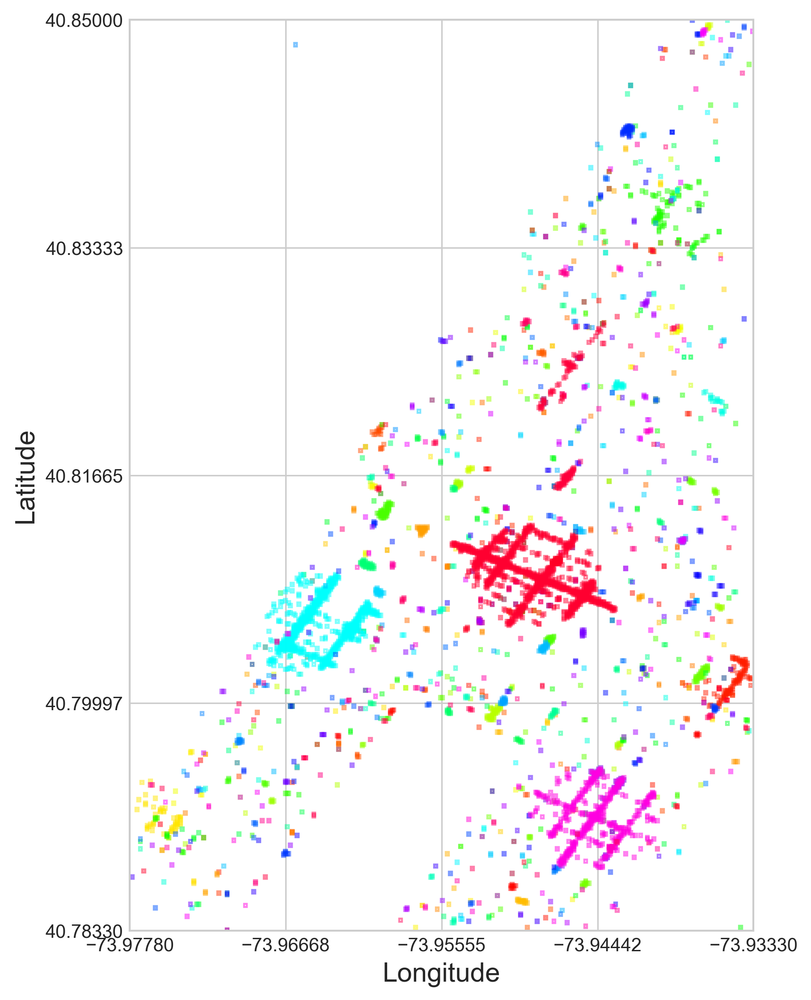

In [82]:
num_plot = min(1000, len(partition_list))
colormap = plt.get_cmap('hsv')
colors = [colormap(i) for i in np.linspace(0, 1, num_plot)]

fig = plt.figure(figsize=get_figsize_for_bbox(bbox_large, figwidth=6), dpi=300)
ax = plt.subplot(1, 1, 1)
for i in range(num_plot):
    plot_grids(partition_list[np.random.randint(len(partition_list))], bbox_large, bbox_large, ax=ax, color=colors[i])
plt.show()

### Merge partitions
Algorithm 1 in paper.

In [27]:
# T1 in meters
threshold_one = 400

partition_centers = []
partition_pdrs = []
for partition in partition_list:
    partition_centers.append(np.array([np.mean(l) for l in zip(*partition)]))
    partition_pdrs.append(np.sum([grid_pdrs[ind] for ind in partition]))
combined_list = zip(partition_list, partition_centers, partition_pdrs)
combined_list = sorted(combined_list, key=lambda x: x[2], reverse=True)
assert np.all([np.all([isinstance(grid, tuple) for grid in grids]) for grids, center, pdrs in combined_list]), \
    'Check combined_list types failed!'

In [28]:
def calculate_straight_dist(center1, center2):
    center1 = np.array(center1)
    center2 = np.array(center2)
    return np.sqrt(np.power((center1 - center2).reshape([2]) * np.array([grid_size, grid_size]), 2).sum())


cluster_list = []
unselected = list(range(len(combined_list)))
while len(unselected) > 0:
    # Select the largest cluster
    new_cluster, center, pdrs = combined_list[unselected.pop(0)]
    # Absorb close cluster within distance threshold_one
    absorbed_inds = []
    for ind in unselected:
        if calculate_straight_dist(center, combined_list[ind][1]) <= threshold_one:
            new_cluster.extend(combined_list[ind][0])
            absorbed_inds.append(ind)
    for ind in absorbed_inds:
        unselected.remove(ind)
    cluster_list.append(new_cluster)
    
assert np.all([np.all([isinstance(grid, tuple) for grid in cluster]) for cluster in cluster_list]), \
    'Check cluster_list types failed!'

In [29]:
print('Number of clusters: {}'.format(len(cluster_list)))

Number of clusters: 75


In [ ]:
num_plot_cluster = min(100, len(cluster_list))
colormap = plt.get_cmap('hsv')
colors = [colormap(i) for i in np.linspace(0, 1, num_plot_cluster)]

fig = plt.figure(figsize=get_figsize_for_bbox(bbox_large, figwidth=10), dpi=300)
ax = plt.subplot(1, 1, 1)
for i in range(num_plot_cluster):
    plot_grids(cluster_list[i], bbox_large, bbox_large, ax=ax, color=colors[i])
plt.show()

### Split large clusters

In [30]:
def calculate_pdr_sum(grid_indices, x_min, x_max, y_min, y_max):
    s = 0
    for ind_x, ind_y in grid_indices:
        if ind_x >= x_min and ind_x <= x_max \
            and ind_y >= y_min and ind_y <= y_max:
            s += grid_pdrs[ind_x, ind_y]
    return s


def split_grids_x(grid_indices, x_split):
    splits = [[], []]
    for indices in grid_indices:
        if indices[0] < x_split:
            splits[0].append(indices)
        else:
            splits[1].append(indices)
    return splits


def split_grids_y(grid_indices, y_split):
    splits = [[], []]
    for indices in grid_indices:
        if indices[1] < y_split:
            splits[0].append(indices)
        else:
            splits[1].append(indices)
    return splits


def get_index_ranges(indices):
    x_indices, y_indices = zip(*cluster)
    x_min, x_max = min(x_indices), max(x_indices)
    y_min, y_max = min(y_indices), max(y_indices)
    return x_min, x_max, y_min, y_max

threshold_two = 400
splitted_cluster_list = []
iter_count = 0
queue = cluster_list.copy()
while len(queue) > 0:
    cluster = queue.pop(0)
    x_min, x_max, y_min, y_max = get_index_ranges(cluster)
    x_geo_length = (x_max - x_min) * grid_size
    y_geo_length = (y_max - y_min) * grid_size
    if x_geo_length > threshold_two:
        # Split grids in the x axis
        sum_over_y = []
        for x in range(x_min, x_max+1, 1):
            sum_over_y.append(calculate_pdr_sum(cluster, x, x, y_min, y_max))
        assert len(sum_over_y) == x_max - x_min + 1, 'Check sum_over_y failed!'
        # Binary search to find the best split position
        left, right = (1, len(sum_over_y))
        while left < right:
            mid = (left + right) // 2
            if sum(sum_over_y[0:mid]) <= sum(sum_over_y[mid:]):
                left = mid+1
            else:
                right = mid-1
        x_mid = x_min + mid
        splits = split_grids_x(cluster, x_mid)
        assert len(splits[0])>0, 'First split is empty!'
        assert len(splits[1])>0, 'Second split is empty!'
        queue.extend(splits)
    elif y_geo_length > threshold_two:
        # Split grids in the y axis
        sum_over_x = []
        for y in range(y_min, y_max+1, 1):
            sum_over_x.append(calculate_pdr_sum(cluster, x_min, x_max, y, y))
        assert len(sum_over_x) == y_max - y_min + 1, 'Check sum_over_x failed!'
        # Binary search to find the best split position
        left, right = (1, len(sum_over_x))
        while left < right:
            mid = (left + right) // 2
            if sum(sum_over_x[0:mid]) <= sum(sum_over_x[mid:]):
                left = mid+1
            else:
                right = mid-1
        y_mid = y_min + mid
        splits = split_grids_y(cluster, y_mid)
        assert len(splits[0])>0, 'First split is empty!'
        assert len(splits[1])>0, 'Second split is empty!'
        queue.extend(splits)
    else:
        splitted_cluster_list.append(cluster)
    iter_count += 1
    if iter_count % 1000 == 0:
        print('Iter count: {} Size of cluster_list: {} Size of output_cluster_list: {}'
              .format(iter_count, len(cluster_list), len(output_cluster_list)))

In [31]:
# Sort splitted cluster by its PBRs.
cluster_pdrs = []
for cluster in splitted_cluster_list:
    cluster_pdrs.append(np.sum([grid_pdrs[ind] for ind in cluster]))
combined_list = zip(splitted_cluster_list, cluster_pdrs)
combined_list = sorted(combined_list, key=lambda x: x[1], reverse=True)
splitted_cluster_list = [i[0] for i in combined_list]

#### Plot split results comparing to original clusters in the small bounding box

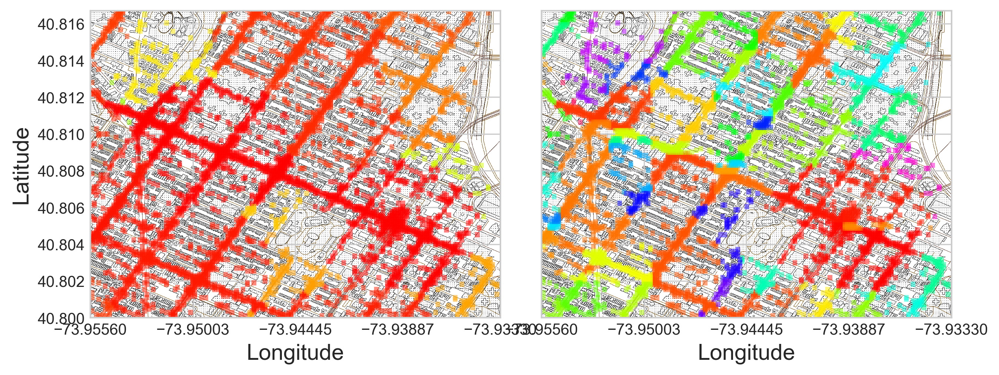

In [74]:
colormap = plt.get_cmap('hsv')
colors = [colormap(i) for i in np.linspace(0, 1, max(len(cluster_list), len(splitted_cluster_list)))]

plot_bbox = bbox_small
grid_bbox = bbox_large
figsize_x, figsize_y = get_figsize_for_bbox(bbox_small, figwidth=5)
fig = plt.figure(figsize=(figsize_x*2, figsize_y), dpi=300)
axs = fig.subplots(1, 2, sharey=True)
fig.subplots_adjust(wspace=0.1)

def clusters_grid_plot(cluster_list, ax):
    for i, cluster in enumerate(cluster_list):
        x_min, x_max, y_min, y_max = get_index_ranges(cluster)
        long_min = x_min * longitude_step + grid_bbox[0]
        long_max = (x_max+1) * longitude_step + grid_bbox[0]
        lat_min = y_min * latitude_step + grid_bbox[1]
        lat_max = (y_max+1) * latitude_step + grid_bbox[1]
#         if (not (long_min > plot_bbox[2] or long_max < plot_bbox[0])) and \
#             (not (lat_min > plot_bbox[3] or lat_max < plot_bbox[1])):
        plot_grids(cluster, plot_bbox, grid_bbox, ax=ax, color=colors[i])


    
map_small_bbox = plt.imread('Map-Data/map_small_bbox.jpeg')
clusters_grid_plot(cluster_list, axs[0])
axs[0].imshow(map_small_bbox, extent=(bbox_small[0], bbox_small[2], bbox_small[1], bbox_small[3]), zorder=0)
clusters_grid_plot(splitted_cluster_list, axs[1])
axs[1].imshow(map_small_bbox, extent=(bbox_small[0], bbox_small[2], bbox_small[1], bbox_small[3]), zorder=0)
axs[1].get_yaxis().cla()
plt.savefig('imgs/splitting_comparison-small-bound.png', dpi=300)
plt.show()

#### Plot split clusters in the large bounding box

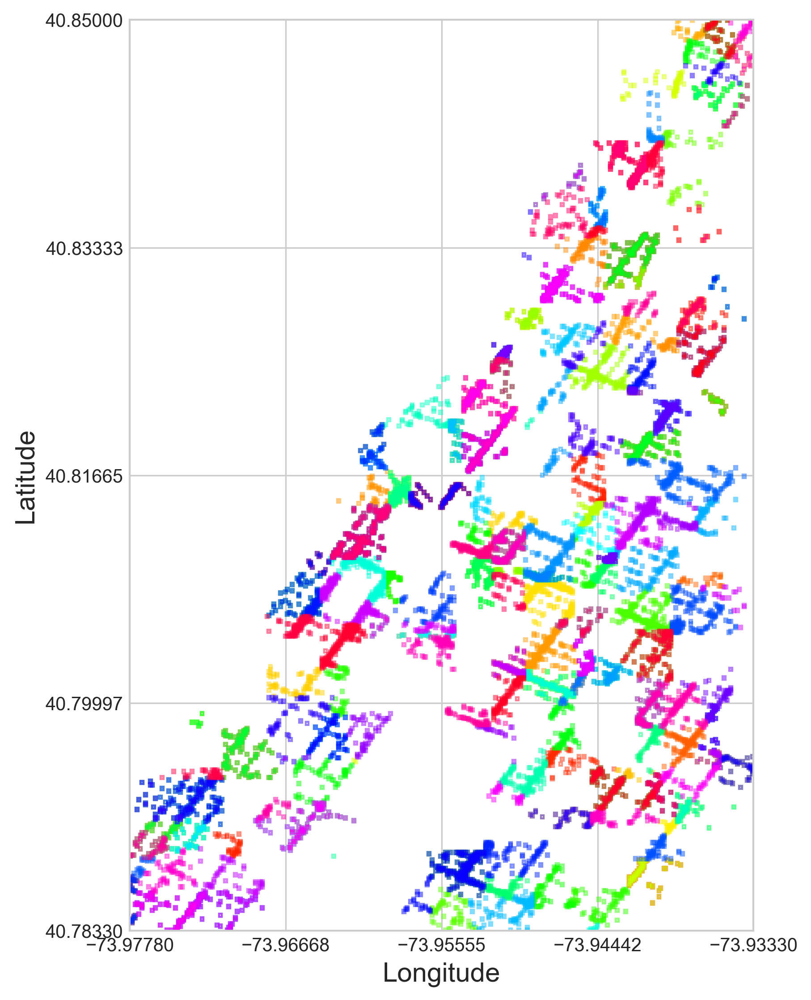

In [84]:
num_plot = min(1000, len(splitted_cluster_list))
colormap = plt.get_cmap('hsv')
colors = [colormap(i) for i in np.linspace(0, 1, num_plot)]

fig = plt.figure(figsize=get_figsize_for_bbox(bbox_large, figwidth=6), dpi=300)
ax = plt.subplot(1, 1, 1)
for i in range(num_plot):
    plot_grids(splitted_cluster_list[np.random.randint(len(splitted_cluster_list))], bbox_large, bbox_large, ax=ax, color=colors[i])
plt.show()

In [86]:
splitted_cluster_area_list = []
for cluster in splitted_cluster_list:
    x_min, x_max, y_min, y_max = get_index_ranges(cluster)
    splitted_cluster_area_list.append((x_max-x_min)*grid_size*(y_max-y_min)*grid_size)
print('Max cluster area after splitting: {}'.format(np.max(splitted_cluster_area_list)))
print('Number of cluster after splitting: {}'.format(len(splitted_cluster_list)))

Max cluster area after splitting: 152100
Number of cluster after splitting: 258


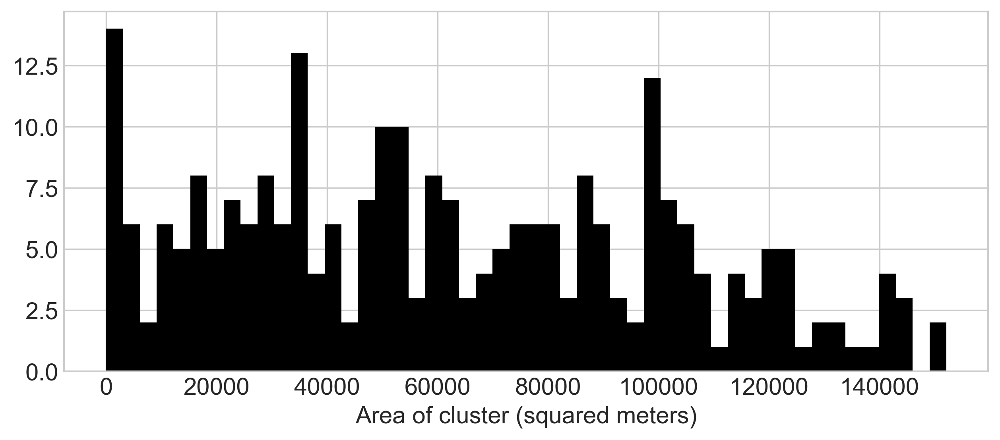

In [112]:
plt.figure(figsize=[10, 4], dpi=300)
plt.hist(splitted_cluster_area_list, bins=50, color='k')
plt.tick_params(axis='both', labelsize='x-large')
plt.xlabel('Area of cluster (squared meters)', fontsize='x-large')
plt.show()

### Bus stop calculate

In [87]:
bus_stop_list = []
for cluster in splitted_cluster_list:
    pdr_sum = np.sum([grid_pdrs[ind] for ind in cluster])
    cd_score = (np.array([conn_degree[ind] for ind in cluster]) + 1) / 9 * 0.5
    pdr_score = np.array([grid_pdrs[ind] for ind in cluster]) / pdr_sum * 0.5
    grid_score = cd_score + pdr_score
    stop_index = np.argmax(grid_score)
    bus_stop_list.append(cluster[stop_index])

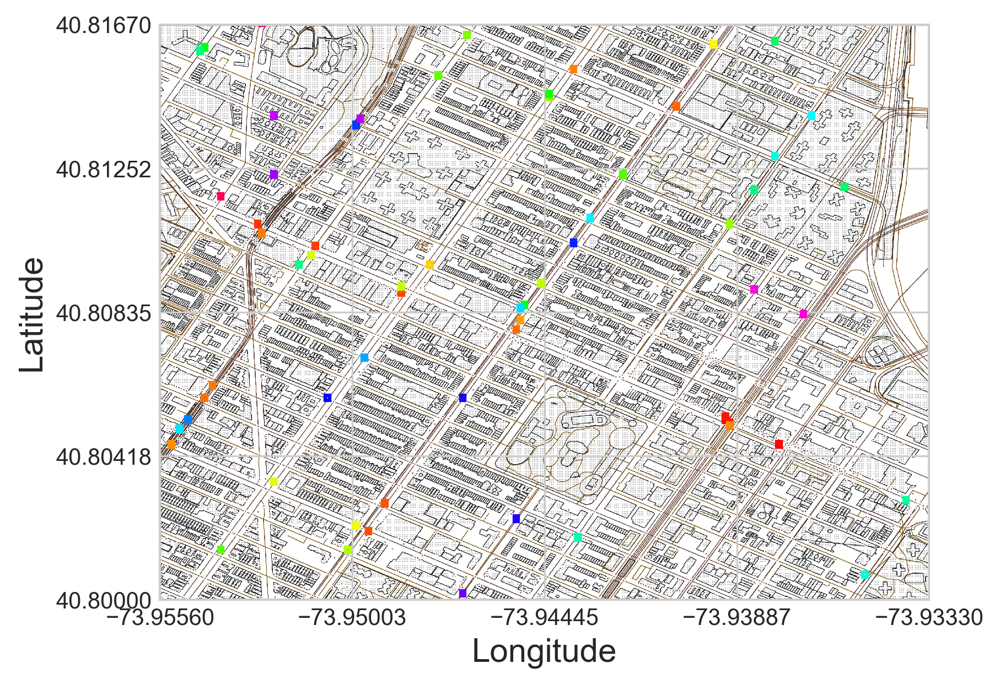

In [77]:
num_plot_stop = min(1000, len(bus_stop_list))
colormap = plt.get_cmap('hsv')
colors = [colormap(i) for i in np.linspace(0, 1, num_plot_stop)]

fig = plt.figure(figsize=get_figsize_for_bbox(bbox_large, figwidth=6), dpi=300)
ax = plt.subplot(1, 1, 1)
for i in range(num_plot_stop):
    plot_grids([bus_stop_list[i]], bbox_small, bbox_large, ax=ax, color=colors[i], grid_alpha=1.0)

map_small_bbox = plt.imread('Map-Data/map_small_bbox.jpeg')
ax.imshow(map_small_bbox, extent=(bbox_small[0], bbox_small[2], bbox_small[1], bbox_small[3]), zorder=0)
plt.savefig('imgs/bus_stops_small_bbox.png', dpi=300, tight_layout=True, bbox_inches='tight')
plt.show()

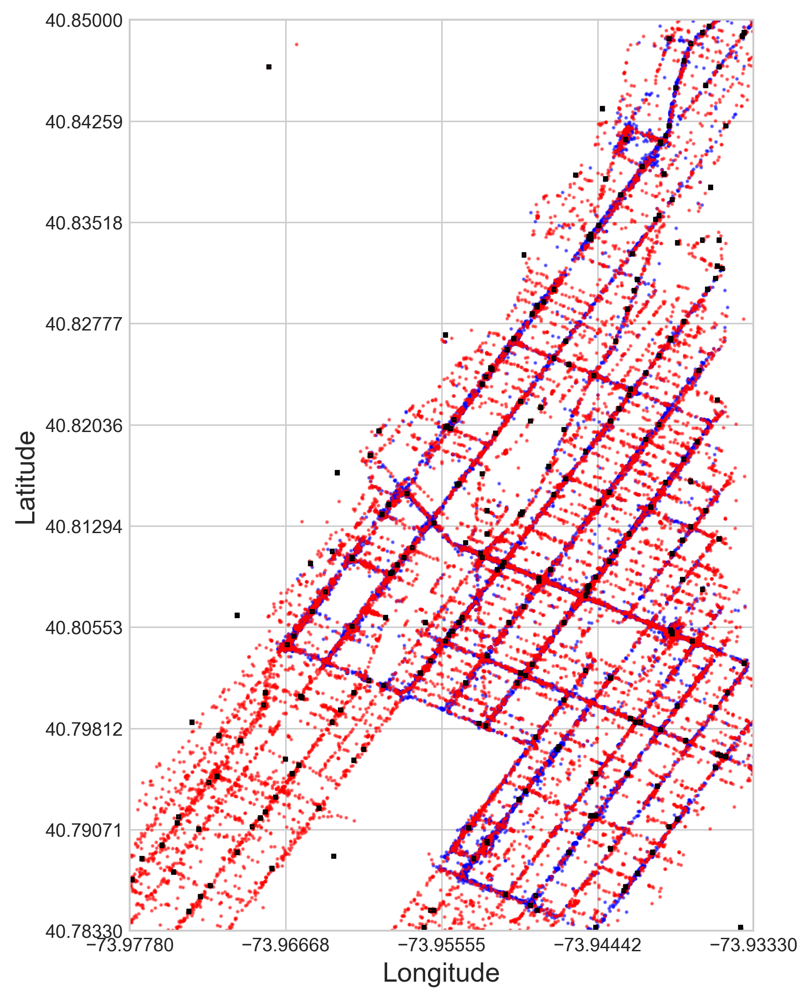

In [109]:
num_plot_stop = min(1000, len(bus_stop_list))
colormap = plt.get_cmap('hsv')
colors = [colormap(i) for i in np.linspace(0, 1, num_plot_stop)]

fig = plt.figure(figsize=get_figsize_for_bbox(bbox_large, figwidth=6), dpi=300)
ax = plt.subplot(1, 1, 1)
for i in range(num_plot_stop):
    plot_grids([bus_stop_list[i]], bbox_large, bbox_large, ax=ax, color='k', grid_alpha=1.0)
plot_location_points(nyc_taxi_trip_df, bbox_large, ax=ax, s=1, alpha=0.5, 
                     color_origin='b', color_destiny='r')
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=True,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=True) # labels along the bottom edge are off
ax.set_title('')
ax.set_xticks(np.linspace(bbox_large[0], bbox_large[2], num=5, endpoint=True))
ax.set_xlabel('Longitude', fontsize='x-large')
plt.savefig('imgs/bus_stops_large_bbox.png', dpi=300, tight_layout=True, bbox_inches='tight')
plt.show()

In [ ]:
get_nearest_stop_index([0, 5])

In [ ]:
np.sum(np.power(np.array(bus_stop_list).reshape(-1, 2) - np.array([0, 5]), 2), axis=0)

## Passenger flow and travel time estimation

In [88]:
def get_nearest_stop_index(point):
    xy = coords2inds(point, bbox_large)
    dist_to_stops = np.sqrt(np.sum(np.power(np.array(bus_stop_list).reshape(-1, 2) - np.array(xy), 2), axis=1))
    return np.argmax(dist_to_stops)
    
num_bus_stops = len(bus_stop_list)
flow_matrix = np.zeros([num_bus_stops, num_bus_stops])
travel_time_matrix = [[[] for i in range(num_bus_stops)] for j in range(num_bus_stops)]
# Method 1: enumerate the trip dataframe
# pbar = tqdm_notebook(total=len(nyc_taxi_trip_df))
# for i in range(len(nyc_taxi_trip_df)):
#     pickupdropoff_datetime = nyc_taxi_trip_df.iloc[i, 0:2].values
#     from_coords = nyc_taxi_trip_df.iloc[i, 2:4]
#     to_coords = nyc_taxi_trip_df.iloc[i, 4:6]
#     from_xy = coords2inds(from_coords, bbox_large)
#     to_xy = coords2inds(to_coords, bbox_large)
#     from_stop_index = get_nearest_stop_index(from_xy)
#     to_stop_index = get_nearest_stop_index(to_xy)
#     flow_matrix[from_stop_index, to_stop_index] += 1
#     travel_time_matrix[from_stop_index][to_stop_index].append((pickupdropoff_datetime[1]-pickupdropoff_datetime[0]).total_seconds())
#     pbar.update(1)

# Method 2: Use previous calculated sparse grid level flow dict, may be inefficient if it is not sparse
pbar = tqdm_notebook(total=num_bus_stops*num_bus_stops)
for from_stop in range(num_bus_stops):
    for to_stop in range(num_bus_stops):
        for from_grid in splitted_cluster_list[from_stop]:
            for to_grid in splitted_cluster_list[to_stop]:
                if (from_grid, to_grid) in grid_level_flow_dict:
                    flow_matrix[from_stop, to_stop] += grid_level_flow_dict[from_grid, to_grid]
        pbar.update(1)

# Divide into 30 minutes flow
flow_matrix = flow_matrix / (24*2)

<ipython-input-88-1bfc4d33f235>:24: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  pbar = tqdm_notebook(total=num_bus_stops*num_bus_stops)


In [89]:
travel_time_matrix = [[[] for i in range(num_bus_stops)] for j in range(num_bus_stops)]
pbar = tqdm_notebook(total=len(nyc_taxi_trip_df))
for i in range(len(nyc_taxi_trip_df)):
    pickupdropoff_datetime = nyc_taxi_trip_df.iloc[i, 0:2].values
    from_coords = nyc_taxi_trip_df.iloc[i, 2:4]
    to_coords = nyc_taxi_trip_df.iloc[i, 4:6]
    from_xy = coords2inds(from_coords, bbox_large)
    to_xy = coords2inds(to_coords, bbox_large)
    from_stop_index = get_nearest_stop_index(from_xy)
    to_stop_index = get_nearest_stop_index(to_xy)
#     flow_matrix[from_stop_index, to_stop_index] += 1
    travel_time_matrix[from_stop_index][to_stop_index].append((pickupdropoff_datetime[1]-pickupdropoff_datetime[0]).total_seconds())
    pbar.update(1)
# Calculate travel time mean
pbar = tqdm_notebook(total=num_bus_stops*num_bus_stops)
for from_stop in range(num_bus_stops):
    for to_stop in range(num_bus_stops):
        travel_time_matrix[from_stop][to_stop] = np.mean(travel_time_matrix[from_stop][to_stop]) * 1.5
        if np.isnan(travel_time_matrix[from_stop][to_stop]):
            straight_dist = calculate_straight_dist(bus_stop_list[from_stop], bus_stop_list[to_stop])
            travel_time_matrix[from_stop][to_stop] = straight_dist / 1000 / 50 * 3600
        pbar.update(1)
travel_time_matrix = np.array(travel_time_matrix)

<ipython-input-89-37b8e14e95b7>:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  pbar = tqdm_notebook(total=len(nyc_taxi_trip_df))


<ipython-input-88-1bfc4d33f235>:3: RuntimeWarning: invalid value encountered in sqrt
  dist_to_stops = np.sqrt(np.sum(np.power(np.array(bus_stop_list).reshape(-1, 2) - np.array(xy), 2), axis=1))
<ipython-input-89-37b8e14e95b7>:15: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  pbar = tqdm_notebook(total=num_bus_stops*num_bus_stops)


C:\Users\13166\Anaconda3\envs\urbanenv\lib\site-packages\numpy\core\fromnumeric.py:3334: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\13166\Anaconda3\envs\urbanenv\lib\site-packages\numpy\core\_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


### Visualize flow matrix and travel time matrix

In [ ]:
num_plot_stop = min(1000, len(bus_stop_list))
colormap = plt.get_cmap('hsv')
colors = [colormap(i) for i in np.linspace(0, 1, num_plot_stop)]
figsize_x, figsize_y = (10, 10)

fig = plt.figure(figsize=get_figsize_for_bbox(bbox_large, figwidth=10), dpi=300)
ax = plt.subplot(1, 1, 1)
for from_stop in range(num_bus_stops):
    for to_stop in range(num_bus_stops):
        if flow_matrix[from_stop, to_stop] > 0:
            plot_grids([bus_stop_list[i]], bbox_large, bbox_large, ax=ax, color=colors[i])

map_small_bbox = plt.imread('Map-Data/map_small_bbox.jpeg')
# ax.imshow(map_small_bbox, extent=(bbox_small[0], bbox_small[2], bbox_small[1], bbox_small[3]), zorder=0)
plt.savefig('imgs/bus_stops_small_bbox.png', dpi=300)
plt.show()

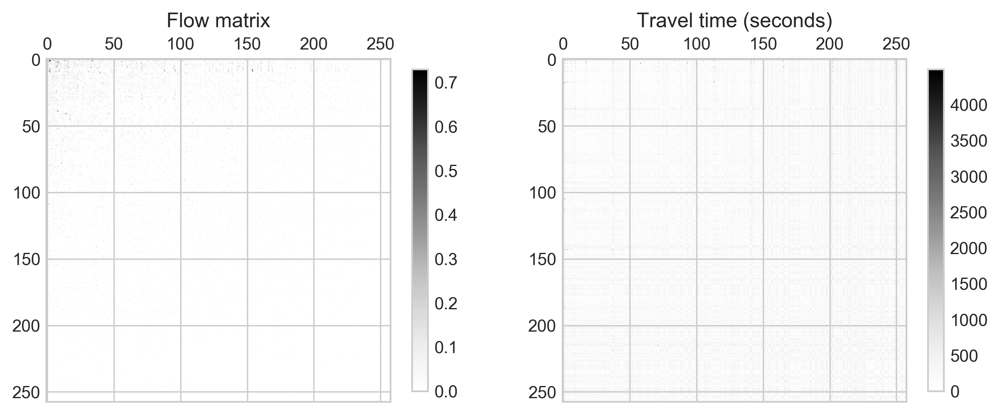

In [162]:
fig = plt.figure(figsize=[10, 5], dpi=300)
axs = fig.subplots(1, 2)
im = axs[0].imshow((flow_matrix[:, :]))
axs[0].set_title('Flow matrix')
axs[0].xaxis.tick_top()
plt.colorbar(im, ax=axs[0], shrink=0.7)
im = axs[1].imshow(travel_time_matrix[:, :])
axs[1].set_title('Travel time (seconds)')
axs[1].xaxis.tick_top()
plt.colorbar(im, ax=axs[1], shrink=0.7)
plt.show()

In [127]:
travel_time_matrix.max()

4490.310810810811

In [132]:
calculate_straight_dist(bus_stop_list[0], bus_stop_list[249]) / 1000 / 50 * 3600

382.75636114896906

In [128]:
4490/60

74.83333333333333

In [121]:
np.where(travel_time_matrix == travel_time_matrix.max())

(array([0], dtype=int64), array([249], dtype=int64))

In [126]:
inds2coords(bus_stop_list[249], bbox_large)

(-73.9679243315508, 40.84648947368421)

In [141]:
t = []
pbar = tqdm_notebook(total=len(nyc_taxi_trip_df))
for i in range(len(nyc_taxi_trip_df)):
    pickupdropoff_datetime = nyc_taxi_trip_df.iloc[i, 0:2].values
    from_coords = nyc_taxi_trip_df.iloc[i, 2:4]
    to_coords = nyc_taxi_trip_df.iloc[i, 4:6]
    from_xy = coords2inds(from_coords, bbox_large)
    to_xy = coords2inds(to_coords, bbox_large)
    from_stop_index = get_nearest_stop_index(from_xy)
    to_stop_index = get_nearest_stop_index(to_xy)
    if from_stop_index == 0 and to_stop_index == 249:
        t.append(i)
    pbar.update(1)

<ipython-input-141-dd4716259717>:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  pbar = tqdm_notebook(total=len(nyc_taxi_trip_df))


<ipython-input-88-1bfc4d33f235>:3: RuntimeWarning: invalid value encountered in sqrt
  dist_to_stops = np.sqrt(np.sum(np.power(np.array(bus_stop_list).reshape(-1, 2) - np.array(xy), 2), axis=1))


In [146]:
nyc_taxi_trip_df.iloc[2, :]

IndexError: positional indexers are out-of-bounds

In [153]:
pickupdropoff_time = nyc_taxi_trip_df.iloc[t[27], 0:2]
pickupdropoff_time

pickup_datetime     2015-02-07 21:11:56
dropoff_datetime    2015-02-08 20:56:22
Name: 27940, dtype: object

In [144]:
nyc_taxi_trip_df.iloc[t, 1] - nyc_taxi_trip_df.iloc[t, 0]

344     00:15:26
362     00:11:28
608     00:11:17
677     00:05:29
2312    00:05:48
3544    00:15:43
7129    00:10:28
7442    00:03:27
8195    00:09:33
9026    00:11:06
14715   00:10:51
15194   00:16:43
17412   00:07:06
18201   00:08:56
18247   00:05:30
19102   00:17:25
19750   00:08:00
20932   00:03:57
21122   00:16:27
21601   00:22:58
21627   00:15:38
22139   00:23:09
22948   00:07:35
23423   00:16:38
24947   00:03:07
26423   00:11:29
26530   00:11:12
27940   23:44:26
27992   00:13:42
28898   00:15:47
31208   00:09:41
32330   00:07:55
32478   00:16:06
33081   00:11:57
34482   00:19:04
37794   00:09:00
40349   00:11:57
dtype: timedelta64[ns]

## Export phase data

In [34]:
index_to_coords = {}
for bus_stop in bus_stop_list:
    index_to_coords[bus_stop] = [bbox_large[0] + bus_stop[0] * longitude_step, bbox_large[1] + bus_stop[1] * latitude_step]

In [ ]:
import pickle
pickle_dict = {
    'bus_stop_index_list': bus_stop_list,
    'index_to_coords': index_to_coords,
    'flow_matrix': flow_matrix,
    'travel_time_matrix': travel_time_matrix,
    'bbox': {
        'lowerleft': {
            'longitude': bbox_large[0], 'latitude': bbox_large[1],
        },
        'upperright': {
            'longitude': bbox_large[2], 'latitude': bbox_large[3],
        }
    },
    'grid_size': grid_size,
    'longitude_step': longitude_step,
    'latitude_step': latitude_step,
}
suffix = 'leftpart_v3'
with open('bus_plan_part1_results_{}.pkl'.format(suffix), 'wb') as f:
    pickle.dump(pickle_dict, f)

## Bus line origin and destination select

Origin: (26, 47)

Destination: (348, 604)

In [ ]:
bus_stop_list

In [42]:
for i, bus_stop in enumerate(bus_stop_list):
    if bus_stop == (26, 47):
        origin_index=i
    if bus_stop == (348, 604):
        destin_index=i
print('Origin stop index:', origin_index, 'coordinates: ', )
print('Destination stop index:', destin_index)

Origin stop index: 150 coordinates: 
Destination stop index: 251


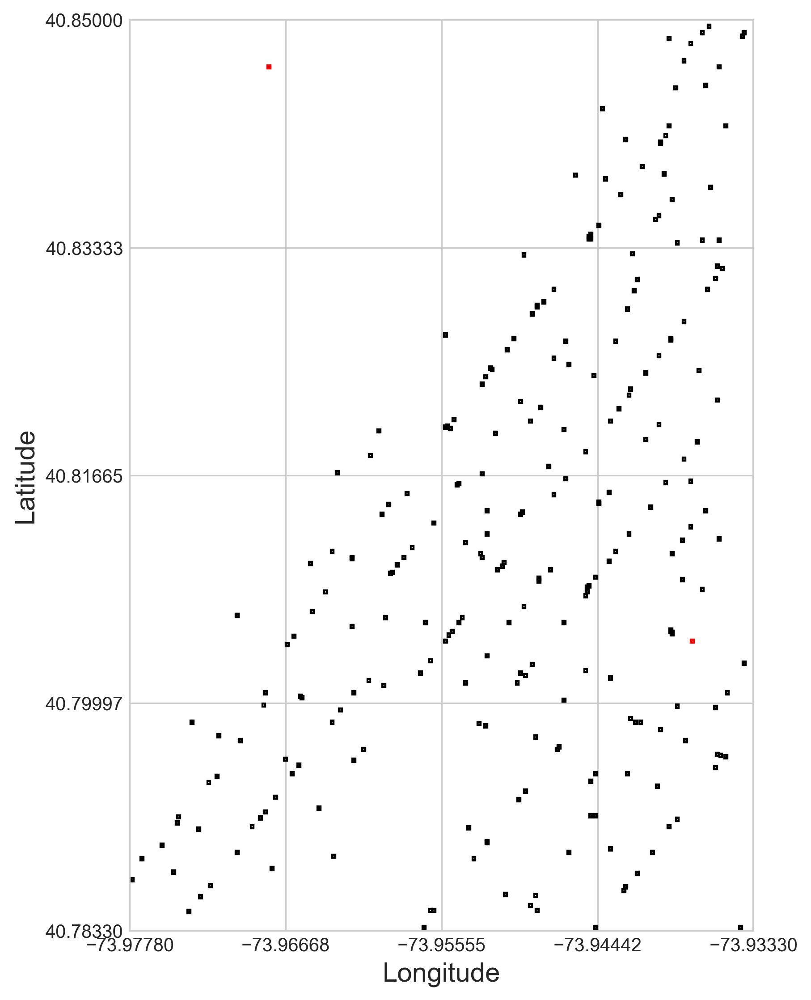

In [135]:
num_plot_stop = min(1000, len(bus_stop_list))
colormap = plt.get_cmap('hsv')
colors = [colormap(i) for i in np.linspace(0, 1, num_plot_stop)]

fig = plt.figure(figsize=get_figsize_for_bbox(bbox_large, figwidth=6), dpi=300)
ax = plt.subplot(1, 1, 1)
for i in range(num_plot_stop):
    if i == 0:
        plot_grids([bus_stop_list[i]], bbox_large, bbox_large, ax=ax, color='r', grid_alpha=1.0)
    elif i == 249:
        plot_grids([bus_stop_list[i]], bbox_large, bbox_large, ax=ax, color='r', grid_alpha=1.0)
    else:
        plot_grids([bus_stop_list[i]], bbox_large, bbox_large, ax=ax, color='k', grid_alpha=1.0)

# map_small_bbox = plt.imread('Map-Data/map_small_bbox.jpeg')
# ax.imshow(map_small_bbox, extent=(bbox_small[0], bbox_small[2], bbox_small[1], bbox_small[3]), zorder=0)
plt.savefig('imgs/origin_desti_bus_stops_large_bbox.png', dpi=300)
plt.show()

### Bus route plot

In [36]:
import pickle
with open('bus-line/graph.pkl', 'rb') as f:
    graph = pickle.load(f)

In [38]:
len(graph['edges'])

745

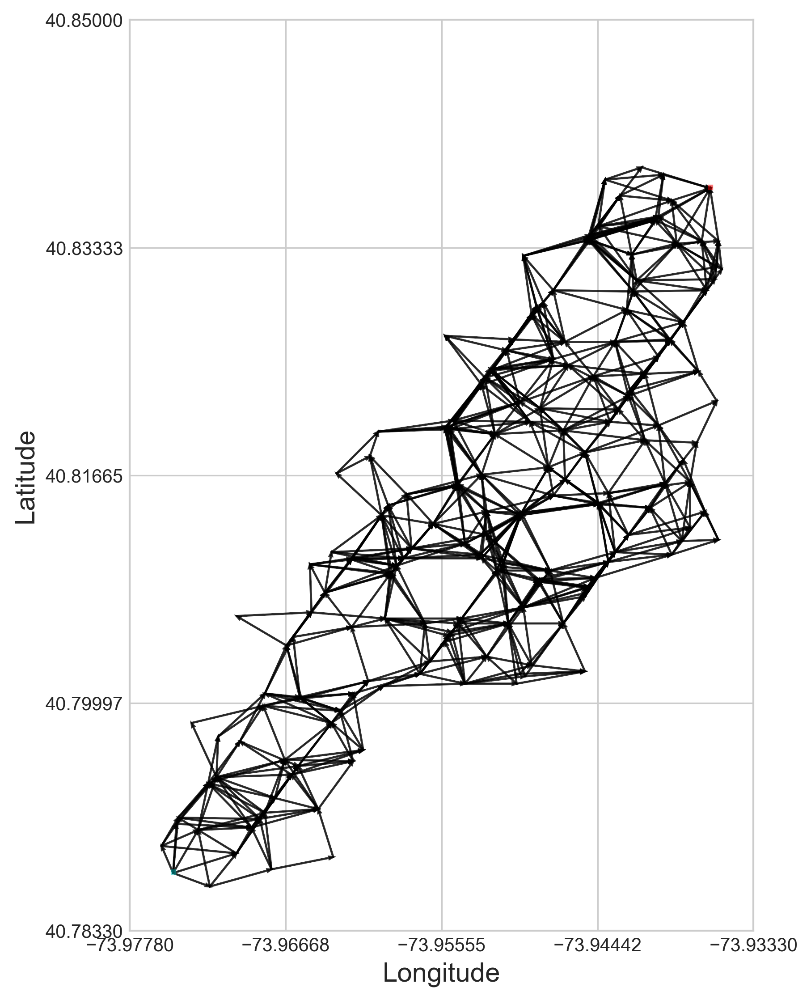

In [62]:
# colormap = plt.get_cmap('hsv')
# colors = [colormap(i) for i in np.linspace(0, 1, num_plot_stop)]

fig = plt.figure(figsize=get_figsize_for_bbox(bbox_large, figwidth=6), dpi=300)
ax = plt.subplot(1, 1, 1)
# for node in graph['nodes']:
#     plot_grids([bus_stop_list[node]], bbox_large, bbox_large, ax=ax, color='k')
from matplotlib.patches import FancyArrow
for from_stop, to_stop in graph['edges'][:]:
    from_coords = inds2coords(bus_stop_list[from_stop], bbox_large)
    to_coords = inds2coords(bus_stop_list[to_stop], bbox_large)
    dxy = np.array(to_coords)-np.array(from_coords)
    ax.add_patch(FancyArrow(*from_coords, dxy[0], dxy[1], 
                            width=0.00002, length_includes_head=True,
                            head_width=0.0002,
                            alpha=0.8, color='k'))
plot_grids([bus_stop_list[origin_index]], bbox_large, bbox_large, ax=ax, color='c')
plot_grids([bus_stop_list[destin_index]], bbox_large, bbox_large, ax=ax, color='r')
# map_small_bbox = plt.imread('Map-Data/map_small_bbox.jpeg')
# ax.imshow(map_small_bbox, extent=(bbox_small[0], bbox_small[2], bbox_small[1], bbox_small[3]), zorder=0)
plt.savefig('imgs/bus_line_large_bbox.png', dpi=300, tight_layout=True, bbox_inches='tight')
plt.show()

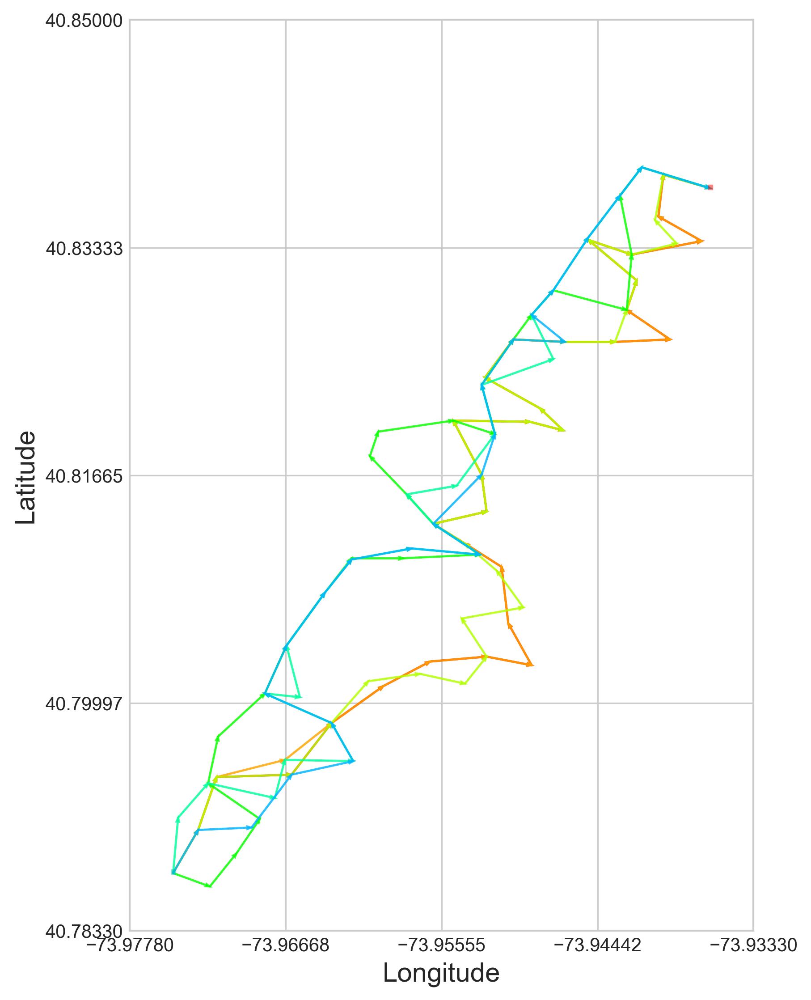

In [140]:
colormap = plt.get_cmap('hsv')
colors = [colormap(i) for i in np.linspace(0, 1, 10)]

fig = plt.figure(figsize=get_figsize_for_bbox(bbox_large, figwidth=6), dpi=300)
ax = plt.subplot(1, 1, 1)
# for node in graph['nodes']:
#     plot_grids([bus_stop_list[node]], bbox_large, bbox_large, ax=ax, color='k')
from matplotlib.patches import FancyArrow
paths=[
    (150, 194, 136, 161, 139, 60, 47, 49, 15, 174, 51, 246, 29, 207, 237, 99, 245, 217, 193, 162, 53, 115, 157, 163, 175, 212, 151, 75, 241, 196, 177, 251),
    (150, 194, 136, 240, 139, 60, 47, 49, 15, 174, 51, 246, 29, 207, 237, 99, 245, 217, 193, 162, 53, 115, 157, 163, 175, 212, 151, 75, 241, 196, 177, 251),
    (150, 194, 136, 161, 139, 65, 64, 72, 49, 21, 145, 110, 246, 29, 207, 237, 99, 245, 217, 193, 162, 53, 115, 157, 175, 212, 151, 75, 233, 227, 177, 251),
    (150, 169, 197, 210, 71, 147, 132, 6, 7, 33, 85, 10, 29, 26, 184, 229, 99, 40, 35, 53, 123, 43, 175, 75, 77, 37, 251),
    (150, 216, 71, 88, 240, 250, 139, 132, 129, 6, 7, 16, 67, 10, 29, 26, 108, 40, 35, 79, 123, 43, 140, 77, 37, 251),
    (150, 194, 198, 161, 250, 139, 132, 6, 7, 16, 67, 10, 29, 237, 40, 35, 53, 115, 123, 43, 140, 77, 37, 251),
]
for j, path in enumerate(paths):
    for i, from_stop in enumerate(path[:-1]):
        from_coords = inds2coords(bus_stop_list[from_stop], bbox_large)
        to_coords = inds2coords(bus_stop_list[path[i+1]], bbox_large)
        dxy = np.array(to_coords)-np.array(from_coords)
        ax.add_patch(FancyArrow(*from_coords, dxy[0], dxy[1], 
                                width=0.00002, length_includes_head=True,
                                head_width=0.0002,
                                alpha=0.8, color=colors[j]))
plot_grids([bus_stop_list[origin_index]], bbox_large, bbox_large, ax=ax, color='c')
plot_grids([bus_stop_list[destin_index]], bbox_large, bbox_large, ax=ax, color='r')
# map_small_bbox = plt.imread('Map-Data/map_small_bbox.jpeg')
# ax.imshow(map_small_bbox, extent=(bbox_small[0], bbox_small[2], bbox_small[1], bbox_small[3]), zorder=0)
plt.show()